# **Training HRPlane Dataset with YOLOv8s: Experiment No. 50**

<p align="center">
    <img src="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/blob/main/assets/image.png" height=450 width=1280 alt=""/>
</p>

<small>Picture Source: <a href="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/">RSandAI, Comprehensive YOLO Airplane Detection</a></small>

<br>

## **Context**

The HRPlanes dataset is a valuable resource in the domain of computer vision, particularly for tasks related to object detection, specifically focusing on aircraft within Very High Resolution (VHR) Google Earth images. This dataset comprises 3101 RGB images of major airports and aircraft boneyards, manually annotated with bounding boxes for airplanes using Plainsight (formerly HyperLabel). Quality control was conducted independently, resulting in 18,477 annotated airplanes. The dataset is split into 70% training (2170 images), 20% validation (620 images), and 10% testing (311 images) sets.

<br>

To facilitate accurate training and evaluation, each aircraft within the images has been meticulously labeled, resulting in a comprehensive annotation set covering a total of 18,477 aircraft instances. These annotations provide bounding box coordinates for each detected aircraft within the corresponding images.

<br>

Given the specifics of the HRPlanes dataset and its annotations, training object detection models like YOLOv8 would involve leveraging this rich dataset to teach the model to accurately detect and localize aircraft within VHR Google Earth images. This process would entail feeding the dataset into the YOLOv8 model architecture and iteratively training the model until satisfactory performance metrics are achieved. Access to the HRPlanes dataset provides researchers, practitioners, and developers with a valuable asset for advancing the state-of-the-art in aircraft detection algorithms, with potential applications spanning aviation security, urban planning, and defense intelligence. The dataset's availability ensures its accessibility to the wider computer vision community, fostering collaboration and innovation in this domain.

**Hyperparameters:**

| Epochs | Network size | Batch size | LR | Optimizer | Hue | Saturation | Value | Mosiac |
|--|--|--|--|--|--|--|--|--|
| 100 | 960x960 | 16 | 0.001 | AdamW | 0.015 | 0.7 | 0.4 | 1.0 |

<br>

Make sure your runtime is **GPU** (_not_ CPU or TPU). And if it is an option, make sure you are using _Python 3_. You can select these settings by going to `Runtime -> Change runtime type -> Select the above mentioned settings and then press SAVE`.

## **0. Initial Steps**

### **0.1 Download Library**

In [ ]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.9/756.9 kB 11.0 MB/s eta 0:00:00


### **0.2. Import Libraries and Connect Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import json
import shutil
import seaborn as sns
import os
from ultralytics import YOLO

### **0.3. Define Paths and Hyperparameters**

In [ ]:
# @markdown ---

BASE_DIRECTORY = '/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8s/Experiment_No_50/' # @param {type:"string"}
if os.path.exists(BASE_DIRECTORY):
    print(f"Base directory already exists: {BASE_DIRECTORY}")
else:
    os.makedirs(BASE_DIRECTORY)
    print(f"Created base directory: {BASE_DIRECTORY}")

SAVE_DIR = BASE_DIRECTORY + 'outputs'
if os.path.exists(SAVE_DIR):
    print(f"Save directory already exists: {SAVE_DIR}")
else:
    os.makedirs(SAVE_DIR)
    print(f"Created save directory: {SAVE_DIR}")

# @markdown ---

IMAGE_SIZE = 960 # @param {type:"integer"}
BATCH = 16 # @param {type:"integer"}
LR = 0.001 # @param {type:"number"}
OPTIMIZER = 'AdamW' # @param {type:"string"}

# @markdown ---

HUE = 0.015 # @param {type:"number"}
SATURATION = 0.7 # @param {type:"number"}
VALUE = 0.4 # @param {type:"number"}
MOSIAC = 1.0 # @param {type:"number"}

# @markdown ---

Created base directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8s/Experiment_No_50/
Created save directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8s/Experiment_No_50/outputs


## **1. Train the Model**

The A100 GPU is a powerful graphics processing unit (GPU) developed by NVIDIA. It is part of the NVIDIA Ampere architecture and is designed for high-performance computing tasks, including deep learning, data analytics, and scientific computing. The A100 GPU offers significant improvements in performance and efficiency compared to previous GPU models, making it ideal for demanding AI and machine learning applications.

In [ ]:
!nvidia-smi

Thu May 16 16:44:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              46W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

### **1.1. Train Model**

YOLOv8s refers to a variant of the YOLO (You Only Look Once) object detection model, specifically based on the YOLOv4 architecture. YOLOv4 is a state-of-the-art deep learning model used for real-time object detection tasks. The "s" in YOLOv8s typically denotes an extended or modified version of the original model, possibly with improvements or adjustments.

In [ ]:
model = YOLO('/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8s.pt')

In [ ]:
%load_ext tensorboard

In [ ]:
results = model.train(data='/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml', epochs=100, imgsz=IMAGE_SIZE, batch=BATCH, lr0=LR, optimizer=OPTIMIZER, hsv_h=HUE, hsv_s=SATURATION, hsv_v=VALUE, mosaic=MOSIAC)

Ultralytics YOLOv8.2.16 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8s.pt, data=/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fals

train: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/train/labels.cache... 2170 images, 4 backgrounds, 0 corrupt: 100%|██████████| 2170/2170 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 960 train, 960 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      9.75G      1.006     0.8723      1.027         72        960: 100%|██████████| 136/136 [02:22<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.68it/s]

                   all        620       3290      0.974      0.959      0.982      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100        11G     0.8452      0.502     0.9608        173        960: 100%|██████████| 136/136 [02:03<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.91it/s]


                   all        620       3290      0.974      0.957      0.986      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.5G     0.8302      0.478     0.9498         99        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.70it/s]

                   all        620       3290      0.969      0.967      0.988      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      9.84G     0.8033       0.46     0.9415        115        960: 100%|██████████| 136/136 [02:01<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.47it/s]

                   all        620       3290      0.976      0.975      0.991      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.3G     0.7827      0.438     0.9432         89        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.27it/s]


                   all        620       3290      0.972      0.963       0.99      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.4G     0.7712     0.4275     0.9326        100        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.41it/s]

                   all        620       3290      0.981      0.969      0.992      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.2G     0.7529     0.4162     0.9279         90        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.07it/s]


                   all        620       3290      0.979      0.978      0.992       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      9.93G     0.7394     0.4098     0.9228        111        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.07it/s]


                   all        620       3290      0.981      0.967      0.991      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.2G      0.737     0.3989     0.9246        121        960: 100%|██████████| 136/136 [01:59<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.05it/s]

                   all        620       3290      0.985      0.979      0.992      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      9.44G     0.7228     0.3944     0.9198        103        960: 100%|██████████| 136/136 [02:01<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.55it/s]

                   all        620       3290      0.979      0.971      0.991      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.1G      0.719     0.3905     0.9155         67        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.33it/s]

                   all        620       3290      0.981      0.982      0.992      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.7G      0.712     0.3808     0.9124         75        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.68it/s]

                   all        620       3290      0.977      0.984      0.992      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.84G     0.6978     0.3792      0.909         87        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.04it/s]

                   all        620       3290       0.98      0.983      0.992      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100       9.8G     0.7126     0.3826     0.9117        103        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.73it/s]

                   all        620       3290      0.984      0.979      0.992      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.5G     0.6848      0.366     0.9015         99        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.39it/s]

                   all        620       3290      0.985      0.983      0.993      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.4G     0.6868     0.3641     0.9048         96        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.97it/s]

                   all        620       3290      0.983       0.98      0.992      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.4G     0.6829     0.3607     0.9037        128        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.35it/s]

                   all        620       3290      0.988      0.974      0.992      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.8G     0.6796     0.3551      0.899         89        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.99it/s]

                   all        620       3290      0.982      0.986      0.993      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.2G     0.6758     0.3498     0.9016        116        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.56it/s]

                   all        620       3290      0.986      0.986      0.993      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      9.94G     0.6686     0.3518     0.8965        207        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.06it/s]

                   all        620       3290      0.985      0.986      0.993      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.2G     0.6634      0.346     0.8948         85        960: 100%|██████████| 136/136 [01:56<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]

                   all        620       3290      0.987      0.986      0.993      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      11.1G     0.6656     0.3466     0.8997         93        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.55it/s]

                   all        620       3290      0.985      0.987      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.5G     0.6565     0.3376     0.8911         67        960: 100%|██████████| 136/136 [01:56<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.62it/s]

                   all        620       3290      0.984       0.99      0.993      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.1G     0.6612     0.3389     0.8941        182        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.66it/s]

                   all        620       3290      0.982      0.989      0.993      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.1G     0.6506     0.3383     0.8877        102        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.29it/s]

                   all        620       3290      0.985      0.984      0.993      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      9.49G     0.6543     0.3359     0.8948        136        960: 100%|██████████| 136/136 [01:53<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.85it/s]

                   all        620       3290      0.984      0.988      0.993      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      9.25G     0.6552     0.3346     0.8904        101        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.81it/s]

                   all        620       3290      0.984      0.985      0.993      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      9.62G     0.6408     0.3296     0.8887        149        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.48it/s]

                   all        620       3290      0.989      0.989      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      9.87G      0.638     0.3288     0.8902        117        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.53it/s]

                   all        620       3290      0.987      0.985      0.993      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.3G     0.6291     0.3238     0.8845         77        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.18it/s]

                   all        620       3290      0.987      0.987      0.993      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.4G      0.635     0.3233     0.8857        120        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.99it/s]

                   all        620       3290      0.986      0.992      0.993      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.3G     0.6289     0.3207     0.8848         96        960: 100%|██████████| 136/136 [01:56<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.26it/s]

                   all        620       3290      0.984      0.992      0.993      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      9.75G     0.6245     0.3153     0.8845        104        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.62it/s]


                   all        620       3290      0.985      0.993      0.993      0.865

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.2G     0.6275     0.3169     0.8835         72        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]


                   all        620       3290      0.983      0.991      0.993      0.862

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      9.75G     0.6231     0.3175     0.8793        121        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]


                   all        620       3290      0.986      0.989      0.993       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      9.35G     0.6197     0.3106     0.8821         98        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.31it/s]

                   all        620       3290      0.983      0.989      0.993      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.9G     0.6025     0.3072     0.8765        209        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.59it/s]

                   all        620       3290      0.988      0.992      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        10G     0.6141     0.3105     0.8785        135        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.53it/s]

                   all        620       3290      0.985      0.988      0.993      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.8G     0.6184      0.313     0.8814         85        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]


                   all        620       3290      0.988      0.982      0.993      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.1G     0.6045      0.306     0.8789        122        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.73it/s]

                   all        620       3290      0.988      0.989      0.994      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.7G     0.6111     0.3086     0.8758         77        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.93it/s]


                   all        620       3290      0.989      0.986      0.993      0.874

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100        11G     0.6005     0.3046      0.878         85        960: 100%|██████████| 136/136 [02:00<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.99it/s]

                   all        620       3290      0.987      0.992      0.993      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.3G     0.5986     0.3026     0.8736         82        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.991      0.988      0.993      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100        10G     0.5949     0.2977     0.8755         96        960: 100%|██████████| 136/136 [01:52<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.31it/s]

                   all        620       3290      0.987      0.991      0.994      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      9.68G     0.5956     0.2998     0.8741         71        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.74it/s]

                   all        620       3290      0.988      0.988      0.994      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.7G     0.5894     0.2959     0.8709        238        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.36it/s]


                   all        620       3290      0.985      0.993      0.994      0.873

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100        11G     0.5902      0.293     0.8694        113        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.11it/s]


                   all        620       3290      0.987      0.989      0.993      0.873

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.3G     0.5945     0.2958      0.873         86        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.989      0.988      0.994      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100        10G     0.5851     0.2923     0.8701         72        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.64it/s]

                   all        620       3290      0.989      0.988      0.994      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.4G     0.5849     0.2915     0.8695         66        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.72it/s]

                   all        620       3290      0.985      0.991      0.994      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.4G      0.586     0.2927     0.8682         98        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.67it/s]

                   all        620       3290      0.989      0.992      0.994      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.8G     0.5832     0.2882      0.872        109        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.65it/s]

                   all        620       3290      0.985      0.993      0.994      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      9.68G      0.576     0.2849     0.8677         94        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.78it/s]

                   all        620       3290       0.99      0.988      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.3G      0.577     0.2864     0.8658         57        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.26it/s]

                   all        620       3290      0.988      0.991      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      9.98G     0.5648     0.2823     0.8637        163        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.03it/s]

                   all        620       3290      0.986      0.992      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.82G     0.5711     0.2831     0.8659         89        960: 100%|██████████| 136/136 [01:53<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.00it/s]

                   all        620       3290      0.987      0.991      0.994      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       9.4G     0.5617     0.2813     0.8655        129        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.987      0.987      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100        10G     0.5718     0.2814      0.863        141        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.39it/s]

                   all        620       3290      0.988      0.988      0.993      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.4G     0.5614     0.2789     0.8603        118        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.70it/s]

                   all        620       3290      0.986       0.99      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      11.2G     0.5527     0.2732      0.855         82        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.85it/s]

                   all        620       3290      0.985      0.989      0.993      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.4G      0.562     0.2778     0.8638         56        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]

                   all        620       3290      0.986       0.99      0.993      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      11.7G     0.5514     0.2718     0.8595         67        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.85it/s]


                   all        620       3290      0.987      0.989      0.994      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.1G     0.5581     0.2772     0.8613        142        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.70it/s]

                   all        620       3290      0.988      0.991      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      9.92G     0.5476      0.269     0.8574        137        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.30it/s]

                   all        620       3290      0.988      0.989      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      9.86G      0.555     0.2704      0.858         88        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.92it/s]

                   all        620       3290      0.987      0.993      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      11.1G     0.5481     0.2686      0.861         71        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.65it/s]

                   all        620       3290      0.989       0.99      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       9.9G     0.5443     0.2726     0.8556        131        960: 100%|██████████| 136/136 [01:53<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]


                   all        620       3290      0.985      0.992      0.994      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.4G     0.5384     0.2653     0.8553         72        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]

                   all        620       3290      0.988      0.991      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.9G     0.5411      0.266     0.8547        119        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.86it/s]

                   all        620       3290      0.988      0.989      0.994      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.5G     0.5446     0.2677     0.8599        110        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.68it/s]

                   all        620       3290      0.987      0.991      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      9.14G     0.5479     0.2681     0.8576        124        960: 100%|██████████| 136/136 [01:58<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.63it/s]

                   all        620       3290      0.993      0.987      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       9.9G     0.5344     0.2614     0.8532        122        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.72it/s]


                   all        620       3290      0.988       0.99      0.994      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      9.44G     0.5245     0.2567     0.8532         81        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.78it/s]


                   all        620       3290       0.99       0.99      0.994      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.4G     0.5222     0.2591      0.851         96        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.49it/s]

                   all        620       3290      0.988      0.992      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.2G     0.5236      0.256     0.8518        131        960: 100%|██████████| 136/136 [02:00<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.55it/s]

                   all        620       3290      0.991      0.988      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      9.84G      0.534     0.2605     0.8542         69        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.64it/s]

                   all        620       3290      0.988       0.99      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.1G     0.5297     0.2606     0.8499        237        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290       0.99      0.993      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.7G     0.5088     0.2474      0.848        133        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.39it/s]

                   all        620       3290      0.992      0.991      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      9.98G     0.5212     0.2566     0.8503         77        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.66it/s]

                   all        620       3290      0.992       0.99      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      9.89G     0.5193     0.2536     0.8517        116        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.06it/s]

                   all        620       3290      0.988      0.995      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      9.41G     0.5113     0.2512     0.8471         87        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.77it/s]

                   all        620       3290      0.991      0.991      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.8G     0.5123     0.2493     0.8477        157        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.89it/s]


                   all        620       3290      0.991       0.99      0.994      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.3G     0.5011     0.2426     0.8475        118        960: 100%|██████████| 136/136 [01:59<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.91it/s]

                   all        620       3290      0.991      0.991      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      9.38G     0.5024     0.2454     0.8458         89        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]


                   all        620       3290       0.99      0.992      0.994      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      9.72G     0.5087     0.2446     0.8464         86        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.06it/s]

                   all        620       3290      0.991      0.995      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.64G     0.5032     0.2434     0.8413         88        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.94it/s]


                   all        620       3290      0.991      0.992      0.994      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       9.4G     0.5026     0.2447     0.8471        101        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.51it/s]


                   all        620       3290      0.989      0.994      0.994      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.7G     0.5044     0.2434      0.844         88        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.92it/s]


                   all        620       3290      0.991      0.991      0.994      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.7G     0.4999     0.2415     0.8441        120        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.05it/s]

                   all        620       3290      0.989      0.992      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      9.89G     0.4919     0.2362     0.8416        130        960: 100%|██████████| 136/136 [01:55<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.991      0.989      0.994       0.89


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      9.61G     0.4816     0.2205     0.8365         79        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.28it/s]

                   all        620       3290      0.991      0.989      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.1G     0.4684     0.2141     0.8297         49        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.34it/s]

                   all        620       3290      0.989      0.993      0.994      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      9.77G     0.4636     0.2112     0.8265         35        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.93it/s]


                   all        620       3290       0.99      0.994      0.994      0.896

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.5G     0.4644     0.2125     0.8304         45        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.991      0.994      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.68G     0.4571      0.209     0.8268         91        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.81it/s]

                   all        620       3290      0.992      0.992      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100        10G     0.4563     0.2092     0.8292         37        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.992      0.993      0.994      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       9.4G     0.4521     0.2077     0.8251         66        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.68it/s]

                   all        620       3290      0.992      0.991      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      9.35G      0.451     0.2061     0.8268         27        960: 100%|██████████| 136/136 [01:53<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.39it/s]

                   all        620       3290      0.989      0.994      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.1G     0.4466     0.2039     0.8258         61        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.51it/s]

                   all        620       3290      0.993       0.99      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      9.58G     0.4482     0.2056     0.8239         71        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.45it/s]

                   all        620       3290      0.989      0.994      0.994      0.896



100 epochs completed in 3.404 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.16 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:24<00:00,  1.20s/it]


                   all        620       3290      0.993       0.99      0.994      0.897
Speed: 0.3ms preprocess, 1.3ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/train


### **1.2. Monitor Training with TensorBoard**


TensorBoard is a powerful visualization tool designed for TensorFlow, a popular open-source machine learning framework developed by Google. It provides a suite of visualization tools to help you understand, debug, and optimize your TensorFlow programs.

In [ ]:
# %tensorboard --logdir {BASE_DIRECTORY}

In [ ]:
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

## **2. Evaluate Model**

In [ ]:
model = YOLO(f"runs/detect/train/weights/best.pt")
metrics = model.val()

Ultralytics YOLOv8.2.16 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:29<00:00,  1.31it/s]


                   all        620       3290      0.993       0.99      0.994      0.898
Speed: 0.2ms preprocess, 2.8ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/val


### **2.1 Monitor Box Metrics**

In [ ]:
# @markdown Run this code block to monitor **box** metrics.

attributes = [
    ('metrics.box.map50', 'Mean Average Precision at IoU threshold of 0.5 for all classes.'),
    ('metrics.box.map75', 'Mean Average Precision at IoU threshold of 0.75 for all classes.'),
    ('metrics.box.ap', 'Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.'),
    ('metrics.box.mp', 'Mean Precision of all classes.'),
    ('metrics.box.mr', 'Mean Recall of all classes.'),
    # ('metrics.box.mean_results', 'Mean of results, returns Mean Precision, Mean Recall, Mean Average Precision at IoU threshold of 0.5, Mean Average Precision at IoU threshold of 0.5 to 0.95.'),
    ('metrics.box.p', 'Precision for each class.'),
    ('metrics.box.r', 'Recall for each class.'),
    ('metrics.box.f1', 'F1 score for each class.'),
    ('metrics.box.nc', 'Number of classes.')
]

for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    print(f'{attr}: {value:.4f} - {explanation}')

with open(f"{BASE_DIRECTORY}outputs/attributes.json", "w") as f:
    json.dump(attributes, f)

box_metrics_dict = {}
for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    box_metrics_dict[attr] = {
        "value": value,
        "description": explanation
    }

with open(f"{BASE_DIRECTORY}outputs/box_metrics.json", "w") as f:
    json.dump(box_metrics_dict, f)

metrics.box.map50: 0.9940 - Mean Average Precision at IoU threshold of 0.5 for all classes.
metrics.box.map75: 0.9900 - Mean Average Precision at IoU threshold of 0.75 for all classes.
metrics.box.ap: 0.8983 - Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.
metrics.box.mp: 0.9934 - Mean Precision of all classes.
metrics.box.mr: 0.9903 - Mean Recall of all classes.
metrics.box.p: 0.9934 - Precision for each class.
metrics.box.r: 0.9903 - Recall for each class.
metrics.box.f1: 0.9918 - F1 score for each class.
metrics.box.nc: 1.0000 - Number of classes.


### **2.2 Monitor Best Metrics**

In [ ]:
# @markdown Run this block to monitor **best** metrics.

for key, value in metrics.results_dict.items():
    if key == 'metrics/precision(B)':
        print(f'Precision: {value:.4f} - Percentage of correct positive predictions.')
    elif key == 'metrics/recall(B)':
        print(f'Recall: {value:.4f} - Percentage of actual positives that were correctly predicted.')
    elif key == 'metrics/mAP50(B)':
        print(f'mAP50: {value:.4f} - Mean Average Precision at 50% IOU.')
    elif key == 'metrics/mAP50-95(B)':
        print(f'mAP50-95: {value:.4f} - Mean Average Precision between 50% and 95% IOU.')
    # else:
    #     print(f'{key}: {value:.4f}')

precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'F1 Score: {f1_score:.4f} - Harmonic mean of precision and recall.')

metrics_dict = {}
for key, value in metrics.results_dict.items():
    attribute = next((desc for attr, desc in attributes if attr == key), None)
    metrics_dict[key] = {
        "value": value,
        "description": attribute if attribute is not None else "No description available"
    }

with open(f"{BASE_DIRECTORY}outputs/metrics.json", "w") as f:
    json.dump(metrics_dict, f)

Precision: 0.9934 - Percentage of correct positive predictions.
Recall: 0.9903 - Percentage of actual positives that were correctly predicted.
mAP50: 0.9940 - Mean Average Precision at 50% IOU.
mAP50-95: 0.8983 - Mean Average Precision between 50% and 95% IOU.
F1 Score: 0.9918 - Harmonic mean of precision and recall.


### **2.3. Plot Confusion Matrix and Calculate Overall Accuracy**

In [ ]:
def calculate_accuracy(TP, FN, FP):

    accuracy = (TP) / (TP + FN + FP)

    return accuracy

In [ ]:
cm = metrics.confusion_matrix.matrix

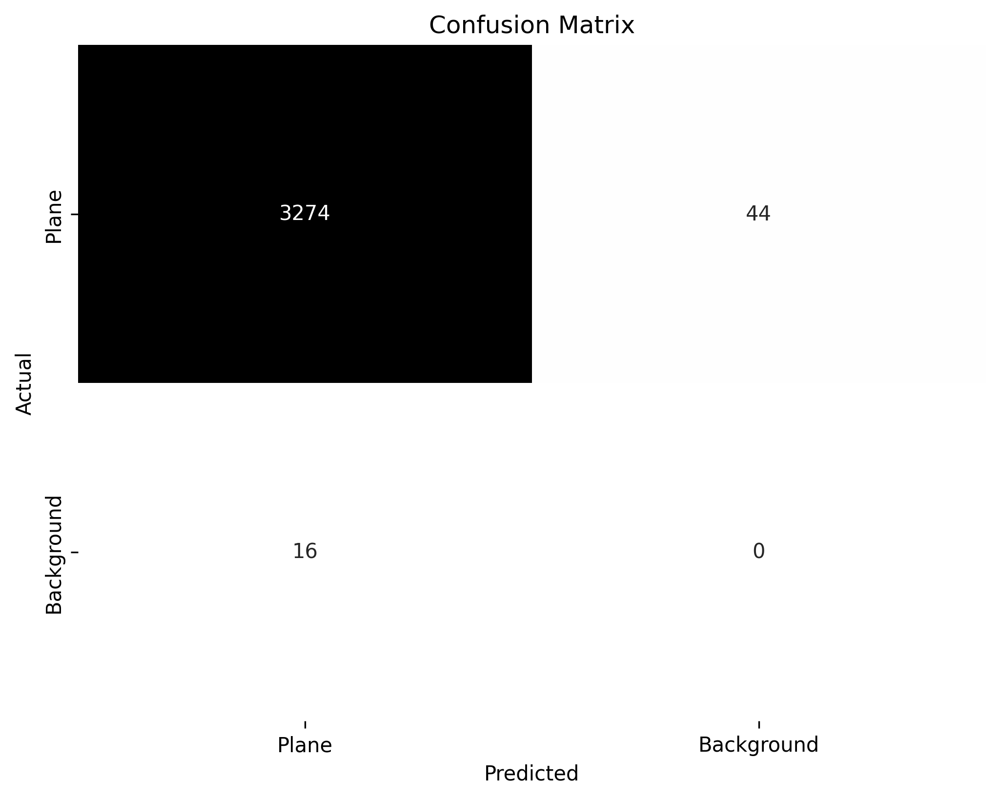

In [ ]:
plt.figure(figsize=(8, 6), dpi=300)
sns.heatmap(cm.astype(int), annot=True, fmt='d', cmap='Greys', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.xticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.yticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.savefig(f"{BASE_DIRECTORY}/outputs/confusion_matrix_customized.png")
plt.show()

In [ ]:
TP = int(cm[0][0])
FN = int(cm[1][0])
FP = int(cm[0][1])

accuracy = calculate_accuracy(TP, FN, FP)

print("Accuracy:", round(accuracy, 4))

Accuracy: 0.982


### **2.4. Plot Best Results**

**mAP50 (mean Average Precision at 50)** is a metric commonly used in object detection tasks, including those using YOLO (You Only Look Once) models like YOLOv8s. It calculates the average precision of detecting objects across different categories at a specific intersection over union (IoU) threshold of 0.5.

<br>

**mAP50-95 (mean Average Precision from 50 to 95)** is an extension of mAP50 that calculates the average precision over a range of IoU thresholds, typically from 0.5 to 0.95, with a step size of 0.05. This metric provides a more comprehensive evaluation of the model's performance across a wider range of IoU thresholds, capturing its ability to detect objects with varying levels of overlap with ground truth annotations.

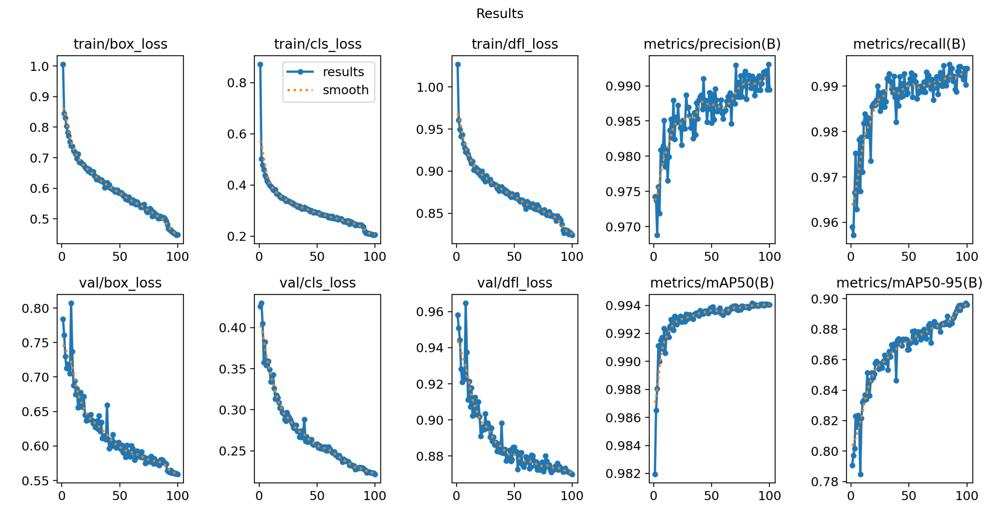

In [ ]:
image = mpimg.imread(f"/content/runs/detect/train/results.png")
plt.figure(figsize=(16, 9), dpi=300)
plt.title('Results')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
csv_file_path = f"/content/runs/detect/train/results.csv"
df = pd.read_csv(csv_file_path)
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.00620,0.87228,1.02720,0.97424,0.95897,0.98195,0.79071,0.78380,0.42578,0.95815,0.067243,0.000331,0.000331
1,2,0.84515,0.50204,0.96076,0.97372,0.95719,0.98649,0.79699,0.76099,0.42984,0.95080,0.034236,0.000658,0.000658
2,3,0.83018,0.47802,0.94979,0.96877,0.96657,0.98806,0.80182,0.72974,0.40494,0.94441,0.001223,0.000978,0.000978
3,4,0.80329,0.46003,0.94147,0.97567,0.97523,0.99113,0.82286,0.71267,0.35771,0.92822,0.000970,0.000970,0.000970
4,5,0.78275,0.43803,0.94316,0.97189,0.96292,0.99002,0.81581,0.71871,0.38263,0.92093,0.000960,0.000960,0.000960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.45630,0.20923,0.82916,0.99173,0.99271,0.99401,0.89516,0.56195,0.22361,0.87142,0.000060,0.000060,0.000060
96,97,0.45215,0.20773,0.82506,0.99213,0.99149,0.99411,0.89550,0.56147,0.22319,0.87096,0.000050,0.000050,0.000050
97,98,0.45096,0.20609,0.82676,0.98948,0.99392,0.99407,0.89594,0.55923,0.22283,0.87080,0.000040,0.000040,0.000040
98,99,0.44657,0.20391,0.82577,0.99309,0.99027,0.99403,0.89712,0.56020,0.22283,0.87034,0.000030,0.000030,0.000030


### **2.5. Plot Labels and Predicted Results**

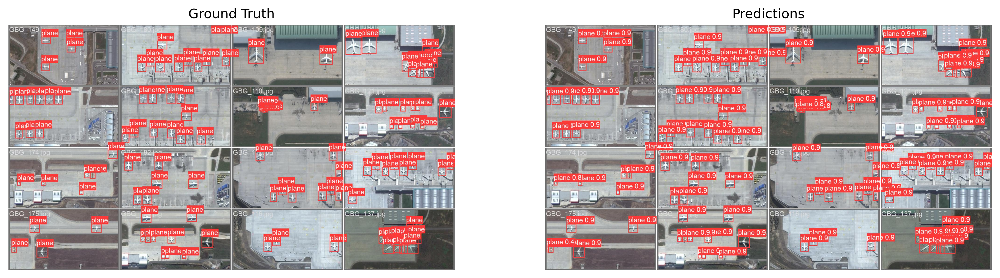

In [ ]:
image1 = mpimg.imread(f"/content/runs/detect/val/val_batch0_labels.jpg")
image2 = mpimg.imread(f"/content/runs/detect/val/val_batch0_pred.jpg")

fig, axes = plt.subplots(1, 2, figsize=(16, 9), dpi=300)
axes[0].imshow(image1)
axes[0].set_title('Ground Truth')
axes[0].axis('off')
axes[1].imshow(image2)
axes[1].set_title('Predictions')
axes[1].axis('off')
plt.savefig(f"{BASE_DIRECTORY}/outputs/label_pred.png")
plt.show()

## **3. Move Model Items into Google Drive**

Instead of uploading and downloading files, we can directly move them to the desired path.

In [ ]:
shutil.move("/content/runs/detect/", BASE_DIRECTORY)

'/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8s/Experiment_No_50/detect'

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2024-05-16 20:10:56
